In [6]:
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import time
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline
from scipy.stats import shapiro
import category_encoders as ce # импорт для работы с кодировщиком
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv('hotels.csv')
data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643


Первоначальная версия датасета содержит 17 полей со следующей информацией:

* hotel_address — адрес отеля;

* review_date — дата, когда рецензент разместил соответствующий отзыв;

* average_score — средний балл отеля, рассчитанный на основе последнего комментария за последний год;

* hotel_name — название отеля;

* reviewer_nationality — страна рецензента;

* negative_review — отрицательный отзыв, который рецензент дал отелю;

* review_total_negative_word_counts — общее количество слов в отрицательном отзыв;

* positive_review — положительный отзыв, который рецензент дал отелю;

* review_total_positive_word_counts — общее количество слов в положительном отзыве.

* reviewer_score — оценка, которую рецензент поставил отелю на основе своего опыта;

* total_number_of_reviews_reviewer_has_given — количество отзывов, которые рецензенты дали в прошлом;

* total_number_of_reviews — общее количество действительных отзывов об отеле;

* tags — теги, которые рецензент дал отелю;

* days_since_review — количество дней между датой проверки и датой очистки;

* additional_number_of_scoring — есть также некоторые гости, которые просто поставили оценку сервису, но не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.

* lat — географическая широта отеля;

* lng — географическая долгота отеля.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

In [8]:
# для предварительного анализа датасета используем Pandas-profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(data, title="Booking_hotels")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

На основании данных, предоставленных Pandas-profiling, можно сделать несколько предварительных выводов:

* в датасете присутствуют 307 дубликатов
* в колонках 'lat' и 'lng' есть по 2448 пропусков
* между признаками 'total_number_of_reviews' и 'additional_number_of_scoring' достаточно сильная корреляция

### работа с дубликатами

Поскольку по условиям соревнования дубликаты удалять нельзя, то создаем колонку , где дубликаты помечаются 1, недублированные значения - 0.

In [10]:
dupl_columns = list(data.columns)

mask = data.duplicated(subset = dupl_columns)
data_duplicates = data[mask]
# print(f'Число найденных дубликатов: {data_duplicates.shape[0]}')
print('Число найденных дубликатов:', data_duplicates.shape[0])

# Создание признака с пометкой о дублировании записи
data['duplicates'] = data.duplicated(subset = dupl_columns)

# Приведение признака к числовому виду
data['duplicates'] = data['duplicates'].apply(lambda x: 1 if x else 0)

Число найденных дубликатов: 307


### знакомство с пропусками в датасете

поскольку в датасете имеются пропуски, посмотрим фрагмент датасета, где в строках эти пропуси есть, выделив их в отдельный датасет

In [11]:
hot = data[data.lat.isna()]
hot.head(10)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,duplicates
122,Savoyenstra e 2 16 Ottakring 1160 Vienna Austria,86,8/26/2016,8.3,Austria Trend Hotel Schloss Wilhelminenberg Wien,United States of America,Not much,3,1558,Bugs in our room Bad Wifi,7,3,2.5,"[' Leisure trip ', ' Couple ', ' Classic Room ...",342 day,NaN,NaN,0
566,23 Rue Damr mont 18th arr 75018 Paris France,21,6/23/2016,8.3,Holiday Inn Paris Montmartre,United Kingdom,N a,3,298,Great location friendly and very helpful staff,8,2,7.1,"[' Leisure trip ', ' Family with older childre...",406 day,NaN,NaN,0
724,Josefst dter Stra e 10 12 08 Josefstadt 1080 V...,333,8/6/2015,8.3,Fleming s Selection Hotel Wien City,United Arab Emirates,The bed so comfortable and room design,8,3672,Lovely location and friendly staff Close the ...,13,4,9.6,"[' Leisure trip ', ' Solo traveler ', ' Superi...",728 day,NaN,NaN,0
754,W hringer Stra e 33 35 09 Alsergrund 1090 Vien...,214,1/4/2016,7.8,Hotel Atlanta,Romania,No Negative,0,2724,location near the city centre quiet clean,8,26,8.8,"[' Leisure trip ', ' Family with older childre...",577 day,NaN,NaN,0
1137,4 rue de la P pini re 8th arr 75008 Paris France,172,1/5/2016,8.8,Maison Albar Hotel Paris Op ra Diamond,Luxembourg,The breakfast was to minimalist for this price,9,1524,No Positive,0,1,8.8,"[' Leisure trip ', ' Couple ', ' Executive Dou...",576 day,NaN,NaN,0
1189,Sieveringer Stra e 4 19 D bling 1190 Vienna Au...,115,6/27/2017,8.0,Derag Livinghotel Kaiser Franz Joseph Vienna,Egypt,So small room,4,1496,The location is very good,6,6,6.7,"[' Leisure trip ', ' Solo traveler ', ' Econom...",37 days,NaN,NaN,0
1193,Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Au...,211,6/14/2016,8.6,Hotel City Central,United Kingdom,All very good,4,2923,Excellent location Smart look to hotel Breakf...,12,1,9.6,"[' Leisure trip ', ' Family with older childre...",415 day,NaN,NaN,0
1568,Bail n 4 6 Eixample 08010 Barcelona Spain,96,10/28/2016,8.9,NH Collection Barcelona Podium,United Kingdom,Reception was slow for check in out Problems ...,19,883,Room was v nice comfortable clean,7,1,8.3,"[' Leisure trip ', ' Group ', ' Superior Doubl...",279 day,NaN,NaN,0
1573,W hringer Stra e 33 35 09 Alsergrund 1090 Vien...,214,9/3/2015,7.8,Hotel Atlanta,Mexico,The room was like a sauna Staff did not care ...,17,2724,Nothing,2,12,3.8,"[' Leisure trip ', ' Solo traveler ', ' Single...",700 day,NaN,NaN,0
1618,Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Au...,211,12/26/2015,8.6,Hotel City Central,Turkey,Nothing,2,2923,Great location Clean rooms Newly renovated ba...,13,8,10.0,"[' Leisure trip ', ' Group ', ' Standard Doubl...",586 day,NaN,NaN,0


При внимательном рассмотрении этого фрагмента обнаруживаем, что пропуски есть не только в колонках 'lat' и 'lng', но также пропущены символы/несколько символов в колонках 'hotel_address' и 'hotel_name'. Выделим уникальные значения 'hotel_address' этого фрагмента исходного датасета.

In [12]:
setm = set(hot['hotel_address'].unique())
display(setm)
print('Получено уникальных значений: ', len(setm))

{'20 Rue De La Ga t 14th arr 75014 Paris France',
 '23 Rue Damr mont 18th arr 75018 Paris France',
 '4 rue de la P pini re 8th arr 75008 Paris France',
 'Bail n 4 6 Eixample 08010 Barcelona Spain',
 'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria',
 'Hasenauerstra e 12 19 D bling 1190 Vienna Austria',
 'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria',
 'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria',
 'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria',
 'Paragonstra e 1 11 Simmering 1110 Vienna Austria',
 'Pau Clar s 122 Eixample 08009 Barcelona Spain',
 'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria',
 'Sep lveda 180 Eixample 08011 Barcelona Spain',
 'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria',
 'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria',
 'W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria',
 'W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria'}

Получено уникальных значений:  17


Видим, что пропуски вместо символов есть, но они не затрагивают почтовый индекс отеля и название города, информаицю по которым мы в дальнейшем собираемся использовать для определения координат отеля.

# Анализ, очистка и обрабока признаков датасета

# признак hotel_address (адрес отеля)

Адрес отеля "де-факто" - это широта и долгота. Но именно в колонках 'lat' и 'lng' есть пропуски. Поэтому выделяем из текстовой части этого признака город и почтовый индекс. На основании признака почтоового индекса мы в дальнейшем сможем относительно точно определить широту и долготу отеля, чьи координаты в признаках 'lat' и 'lng'в датасете отсутствуют.

In [14]:
# обработка hotel_address: выделяем города для и индексы заполненияя координат в пустых значениях lot и lng
data['city'] = data.hotel_address.apply(lambda x: 'London' if x.endswith('United Kingdom') else x.split()[-2])
data['zip'] = data.hotel_address.apply(lambda x: x.split()[-4] + ' ' + x.split()[-3] if x.endswith('United Kingdom') or x.endswith('Netherlands') else x.split()[-3])
data['city'].value_counts()

London       196774
Barcelona     45132
Paris         44830
Amsterdam     43006
Vienna        29178
Milan         27883
Name: city, dtype: int64

In [15]:
data['zip'].value_counts()

1010       9320
20124      8803
75008      8284
08002      7614
75001      4120
           ... 
1230         17
1017 JW      16
20141        13
E2 7DD        9
92120         5
Name: zip, Length: 601, dtype: int64

Группируем данные по городу и почтовому индексу для получения средних значений географических координат почтовых индексов, которыми заполняем отсутствующие значения 'lat' и 'lng'

In [16]:
geo = data.groupby(['city', 'zip']).agg({'lat': 'mean', 'lng': 'mean'})#reset_index()
data = data.merge(geo, on=['city', 'zip'], how= 'left', suffixes=('', '_avg'))

In [17]:
data['lat'] = np.where(data.lat.isna(), data.lat_avg, data.lat)
data['lng'] = np.where(data.lng.isna(), data.lng_avg, data.lng)
# Теперь колонки 'lat_avg' и 'lng_avg' нам дальше не понадобятся, удаляем их.
data = data.drop(['lat_avg', 'lng_avg'], axis=1)
data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,duplicates,city,zip
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,3,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671,0,London,W1J 8LT
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,1,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097,0,London,WC1B 5AF
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,2,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643,0,Paris,75006


Создаем список городов

In [18]:
list_town = data['city'].value_counts().keys().tolist()
list_town

['London', 'Barcelona', 'Paris', 'Amsterdam', 'Vienna', 'Milan']

Исходим из гипотезы, что чем ближе гостиница к центру города, тем более высокими у нее должны быть стандарты обслуживания. Это не зависит от "звездности" отеля, просто конкуренция ближе к центру города выше. Используем пакет geopy.distance для вычисления расстояния от центра города. Координаты центра города берем с сайта https://time-in.ru

In [19]:
from geopy.distance import great_circle as GC    
# https://pythobyte.com/pandas-apply-a-helpful-illustrated-guide-2ff5fc95/   - как писать такую пользовательскую функцию
def dist (data):
    hotel_curr = (data.loc['lat'], data.loc['lng'])
    if data.loc['city'] == 'London':
        return GC((51.5085, -0.12574), hotel_curr).km
    elif data.loc['city'] == 'Barcelona':
        return GC((4.3888, 2.15899), hotel_curr).km
    elif data.loc['city'] == 'Paris':
        return GC((48.8534, 2.3488), hotel_curr).km
    elif data.loc['city'] == 'Amsterdam':
        return GC((52.374, 4.88969), hotel_curr).km
    elif data.loc['city'] == 'Vienna':
        return GC((48.2085, 16.3721), hotel_curr).km
    elif data.loc['city'] == 'Milan':
        return GC((45.4643, 9.18951), hotel_curr).km
        
data['distance'] = data.apply(dist, axis = 1)
data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,...,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,duplicates,city,zip,distance
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,...,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671,0,London,W1J 8LT,1.242776
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,...,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097,0,London,WC1B 5AF,1.402860
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,...,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643,0,Paris,75006,1.914921


In [20]:
# удаляем колонки 'lat' и 'lng', они нам больше не понадобятся
data.drop(['lat', 'lng'], inplace = True, axis = 1)

### Создаем новый признак : 'rainfall' - среднегодовая норма осадков в городе

In [21]:
сity_rainfall = {
    'Paris': 720, 'London': 690, 'Milan': 1162, 
    'Vienna': 703, 'Barcelona': 614, 'Amsterdam': 844
}
data['rainfall'] = data['city'].map(сity_rainfall)

data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,duplicates,city,zip,distance,rainfall
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,3,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,0,London,W1J 8LT,1.242776,690
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,1,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,0,London,WC1B 5AF,1.402860,690
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,2,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,0,Paris,75006,1.914921,720


кодируем колонку **city (город) - новый признак в датасете**

In [22]:
data['city'] = LabelEncoder().fit_transform(data['city'])
data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,duplicates,city,zip,distance,rainfall
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,3,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,0,2,W1J 8LT,1.242776,690
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,1,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,0,2,WC1B 5AF,1.402860,690
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,2,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,0,4,75006,1.914921,720


### Признак 'review_date' (дата, когда рецензент разместил соответствующий отзыв)

In [23]:
data['review_date'] =  pd.to_datetime(data['review_date'])

#### создаем признак 'review_season' (сезон, когда сделан отзыв)

In [24]:
data['review_month'] = data['review_date'].dt.month
def season(qv):
    if qv in [12, 1, 2]:
        return 'winter'
    elif qv in [3, 4, 5]:
        return 'spring'
    elif qv in [6, 7, 8]:
        return 'summer'
    else:
        return 'autumn' 
data['review_season'] = data['review_month'].apply(season)
data['review_season'] = LabelEncoder().fit_transform(data['review_season'])
# удаляем 'review_month', 'review_date' больше не понадобятся
data = data.drop(['review_month', 'review_date'], axis=1)
data.head(3)

,hotel_address,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,duplicates,city,zip,distance,rainfall,review_season
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,3,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,0,2,W1J 8LT,1.242776,690,3
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,1,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,0,2,WC1B 5AF,1.402860,690,3
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,2,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,0,4,75006,1.914921,720,0


### признак 'average_score' (средний балл отеля, рассчитанный на основе последнего комментария за последний год)

Оценим, насколько коррелируют между собой признаки 'average_score' и 'reviewer_score'. По смыслу, вытекающему из названия, они должны быть сильно связаны.

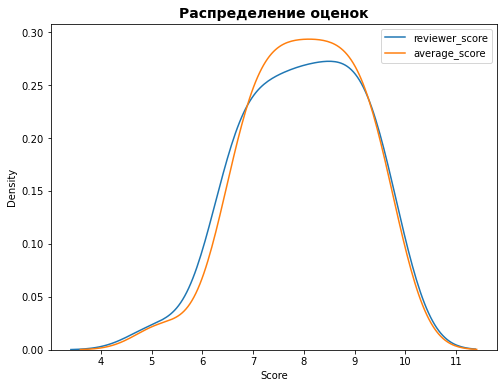

In [27]:
# Создадим сводную таблицу со средними значениями признаков для тренировочной выборки
train_data_score = data.pivot_table(
    values='reviewer_score', 
    index='average_score', 
    aggfunc='mean').reset_index()

# Построим график
fig, (ax) = plt.subplots(figsize=(8, 6))

sns.kdeplot(train_data_score['reviewer_score'], ax=ax, label='reviewer_score')
sns.kdeplot(train_data_score['average_score'], ax=ax, label='average_score')
ax.set_title('Распределение оценок', fontweight='bold', fontsize=14)
ax.set_xlabel('Score')
ax.legend();

Из графика видно, что признаки распределены нормально. Но все же проверим гипотезу о нормальности распределения обоих признаков с помощью критерия Шапиро-Уилка.

In [30]:
from scipy.stats import shapiro

# Формируем гипотезы для проверки
H0 = 'Данные распределены нормально'
Ha = 'Данные не распределены нормально (отвергаем H0)'
alpha = 0.05

_, p = shapiro(train_data_score['reviewer_score'])
print('reviewer_score p-value = %.3f' % p)
if p > alpha:
    print(H0, '\n')
else:
    print(Ha, '\n')


_, p = shapiro(train_data_score['average_score'])
print('average_score p-value = %.3f' % p)
if p > alpha:
    print(H0)
else:
    print(Ha)

reviewer_score p-value = 0.294
Данные распределены нормально 

average_score p-value = 0.599
Данные распределены нормально


Делаем вывод, что **признаки действительно сильно связаны друг с другом.**

### признак 'hotel_name' (название отеля)

Как упоминалось выше, в названии пропущены символы. Сможем обойтись без обработки этого признака, поскольку координаты отеля фактически определяют его уникальный ID

### признак 'days_since_review' (давности комментария в днях)

In [32]:
#  признаке "количество дней с момента отзыва" оставим только число дней.
data['days_since_review'] = data['days_since_review'].str.split().str[0]
data['days_since_review'] = data['days_since_review'].apply( lambda x: int(x) )
data.head(3)

,hotel_address,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,duplicates,city,zip,distance,rainfall,review_season
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,The May Fair Hotel,United Kingdom,Leaving,1,1994,Staff were amazing,3,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531,0,2,W1J 8LT,1.242776,690,3
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,2,1361,location,1,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203,0,2,WC1B 5AF,1.402860,690,3
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,4,406,No Positive,2,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289,0,4,75006,1.914921,720,0


### признак 'reviewer_nationality' (национальность рецензента)

In [33]:
# удаляем начальные и конечные пробелы
data['reviewer_nationality'] = data['reviewer_nationality'].apply(lambda x: x.strip())
data['reviewer_nationality'].value_counts(normalize=True)

United Kingdom              0.475780
United States of America    0.068616
Australia                   0.041983
Ireland                     0.028764
United Arab Emirates        0.019692
                              ...   
Cook Islands                0.000003
Guinea                      0.000003
Comoros                     0.000003
Anguilla                    0.000003
Grenada                     0.000003
Name: reviewer_nationality, Length: 225, dtype: float64

In [34]:
# оставляем только 10 наиболее путешествующих национальностей (~70% от общего числа рецензентов)
most_turist_nation = data['reviewer_nationality'].value_counts().nlargest(10).index
data['reviewer_nationality'] = data['reviewer_nationality'].apply(lambda x:x if x in most_turist_nation else 'Other')

In [35]:
# бинарно кодируем признак 'национальность рецензента'
# bin_encoder = ce.BinaryEncoder(cols=['reviewer_nationality']) # указываем столбец для кодирования
# type_bin = bin_encoder.fit_transform(data['reviewer_nationality'])
# data = pd.concat([data, type_bin], axis=1)

In [36]:
# кодируем получившиеся значения
data['reviewer_nationality'] = LabelEncoder().fit_transform(data['reviewer_nationality'])

### обработка признака 'tags'

оценим, сколько уникальных тэгов содержится в колонке для выработки дальнейшей стратегии работы с ними

In [37]:
def count_tags(tags):
    express = re.findall("'[^\'](.+?)[^\']'", tags)
    return express
data['tags'].apply(count_tags).explode().nunique()

2368

#### создаем новый признак 'count_nights' (количество ночей)

In [38]:
#  Введём новый признак count_nights (количество ночей)
def count_nights(tags):
    express = re.findall(r'Stayed\s([0-9]+)\snight', tags)
    row = ''.join(map(str,express))
    if len(row) == 0:
        return 1
    else:
        return int(row)
data['count_nights'] = data['tags'].apply(count_nights)

In [39]:
data.head(3)

,hotel_address,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,...,reviewer_score,tags,days_since_review,duplicates,city,zip,distance,rainfall,review_season,count_nights
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,The May Fair Hotel,9,Leaving,1,1994,Staff were amazing,3,...,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531,0,2,W1J 8LT,1.242776,690,3,2
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,Mercure London Bloomsbury Hotel,9,poor breakfast,2,1361,location,1,...,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203,0,2,WC1B 5AF,1.402860,690,3,1
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,Legend Saint Germain by Elegancia,5,No kettle in room,4,406,No Positive,2,...,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289,0,4,75006,1.914921,720,0,3


### обработка остальных популярных признаков tags и создание из них новых признаков

In [40]:
data.tags = data.tags.apply(lambda x: x[3:-3].split(" ', ' "))

In [41]:
# Выводим топ тегов
top_tags = list(data.tags.explode().value_counts().index)[:20]
top_tags

['Leisure trip',
 'Submitted from a mobile device',
 'Couple',
 'Stayed 1 night',
 'Stayed 2 nights',
 'Solo traveler',
 'Stayed 3 nights',
 'Business trip',
 'Group',
 'Family with young children',
 'Stayed 4 nights',
 'Double Room',
 'Standard Double Room',
 'Superior Double Room',
 'Family with older children',
 'Deluxe Double Room',
 'Double or Twin Room',
 'Stayed 5 nights',
 'Standard Double or Twin Room',
 'Classic Double Room']

In [42]:
# исключаем из популярных использованные ранее признаки о количестве ночей в гостинице
for i in top_tags:
    if (('Stayed' in i) and  ('night' in i)) or ('Stayed 2 nights' in i):
        top_tags.remove(i)
        
for i in top_tags:        
    if i == 'Stayed 2 nights': # почему-то удаляется только со 2 раза
        top_tags.remove(i) 
top_tags

['Leisure trip',
 'Submitted from a mobile device',
 'Couple',
 'Solo traveler',
 'Business trip',
 'Group',
 'Family with young children',
 'Double Room',
 'Standard Double Room',
 'Superior Double Room',
 'Family with older children',
 'Deluxe Double Room',
 'Double or Twin Room',
 'Standard Double or Twin Room',
 'Classic Double Room']

In [43]:
# Создаем новые признаки из списка top_tags
for tag in top_tags:
    tag_col = tag.lower().replace(' ', '_')
    data[tag_col] = data['tags'].apply(lambda x: 1 if tag in x else 0)

### признаки review_total_negative_word_counts' и 'review_total_positive_word_counts'

In [44]:
# исправляем значения в 'review_total_negative_word_counts' и 'review_total_positive_word_counts', оно подсчитано неверно
data['review_total_negative_word_counts'] = data['negative_review'].apply(lambda x: len(x.split()))
data['review_total_positive_word_counts'] = data['positive_review'].apply(lambda x: len(x.split()))

### признаки 'negative_review' и 'positive_review' - отзывы клиента

In [45]:
display(data['negative_review'].value_counts().reset_index().head(40))

,index,negative_review
0,No Negative,95907
1,Nothing,10737
2,Nothing,3154
3,nothing,1660
4,N A,802
5,None,737
6,,606
7,N a,384
8,Breakfast,296
9,Small room,283


In [46]:
display(data['positive_review'].value_counts().reset_index().head(40))

,index,positive_review
0,No Positive,26885
1,Location,6833
2,Everything,1697
3,location,1251
4,Nothing,931
5,The location,830
6,Great location,809
7,Good location,690
8,Location,663
9,Breakfast,455


Отзыв 'No Negative' в колонке 'negative_review' интерпретируется пакетом vader_lexicon неправильно, как абсолютно негативный: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, ...)
Это неверная оценка, поэтому заменяем его на 'Positive': {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, ...) в новой колонке 'negative_review_red'

In [47]:
# data['negative_review_red'] = data['negative_review']
data['negative_review_red'] = data['negative_review'].apply(lambda x: x.strip())
data.loc[data['negative_review'] == 'No Negative', 'negative_review_red'] = 'Positive'

In [48]:
display(data['negative_review_red'].value_counts().reset_index().head(10))

,index,negative_review_red
0,Positive,95907
1,Nothing,13891
2,nothing,1879
3,None,871
4,N A,818
5,,606
6,Nothing really,435
7,N a,391
8,All good,367
9,Small room,340


Отзыв 'No Positive' в колонке 'positive_review' интерпретируется пакетом vader_lexicon также неверно, как абсолютно позитивный: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, ...).
Меняем его на противоположный 'Negative': {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, ...) 

In [49]:
# data['positive_review_red'] = data['positive_review']
data['positive_review_red'] = data['positive_review'].apply(lambda x: x.strip())
data.loc[data['positive_review'] == 'No Positive', 'positive_review_red'] = 'Negative'

In [50]:
analyz = SentimentIntensityAnalyzer()

# проводим анализ текста с помощью SentimentIntensityAnalyzer()
data['review_neg'] = data['negative_review_red'].apply(lambda x: analyz.polarity_scores(x))
data['review_pos'] = data['positive_review_red'].apply(lambda x: analyz.polarity_scores(x))
data.head(3)

,hotel_address,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,...,superior_double_room,family_with_older_children,deluxe_double_room,double_or_twin_room,standard_double_or_twin_room,classic_double_room,negative_review_red,positive_review_red,review_neg,review_pos
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,The May Fair Hotel,9,Leaving,1,1994,Staff were amazing,3,...,0,0,0,0,0,0,Leaving,Staff were amazing,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 0.345, 'pos': 0.655, 'comp..."
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,Mercure London Bloomsbury Hotel,9,poor breakfast,2,1361,location,1,...,0,0,0,0,0,0,poor breakfast,location,"{'neg': 0.756, 'neu': 0.244, 'pos': 0.0, 'comp...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,Legend Saint Germain by Elegancia,5,No kettle in room,4,406,No Positive,2,...,0,0,0,0,0,0,No kettle in room,Negative,"{'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'comp...","{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound..."


In [51]:
# результаты заносим в датасет data
data.loc[:,['n_neg', 'n_neu', 'n_pos', 'n_compound']] = list(data['review_neg'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)
data.loc[:,['p_neg', 'p_neu', 'p_pos', 'p_compound']] = list(data['review_pos'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)

#### создаем новые признаки  'neg_len' и 'pos_len' - длина отзыва, идентифицированного vader_lexicon

In [52]:
data['neg_len'] = data['negative_review_red'].map(len)
data['pos_len'] = data['positive_review_red'].map(len)

### признак 'total_number_of_reviews'

In [53]:
r_scaler = preprocessing.RobustScaler()
data['total_number_of_reviews']  = pd.DataFrame(r_scaler.fit_transform(pd.DataFrame(data['total_number_of_reviews'])),
    columns=['total_number_of_reviews'])

### признак 'total_number_of_reviews_reviewer_has_given'

In [54]:
data['total_number_of_reviews_reviewer_has_given'] = np.log(data['total_number_of_reviews_reviewer_has_given'])
r_scaler = preprocessing.RobustScaler()
data['total_number_of_reviews_reviewer_has_given']  = pd.DataFrame(r_scaler.fit_transform(pd.DataFrame(data['total_number_of_reviews_reviewer_has_given'])),
    columns=['total_number_of_reviews_reviewer_has_given'])
data.head(3)

,hotel_address,additional_number_of_scoring,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,...,n_neg,n_neu,n_pos,n_compound,p_neg,p_neu,p_pos,p_compound,neg_len,pos_len
0,Stratton Street Mayfair Westminster Borough Lo...,581,8.4,The May Fair Hotel,9,Leaving,1,-0.057096,Staff were amazing,3,...,0.000,1.000,0.0,0.0000,0.0,0.345,0.655,0.5859,7,18
1,130 134 Southampton Row Camden London WC1B 5AF...,299,8.3,Mercure London Bloomsbury Hotel,9,poor breakfast,2,-0.315253,location,1,...,0.756,0.244,0.0,-0.4767,0.0,1.000,0.000,0.0000,14,8
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,8.9,Legend Saint Germain by Elegancia,5,No kettle in room,4,-0.704731,No Positive,2,...,0.423,0.577,0.0,-0.2960,1.0,0.000,0.000,-0.5719,17,8


<AxesSubplot:>

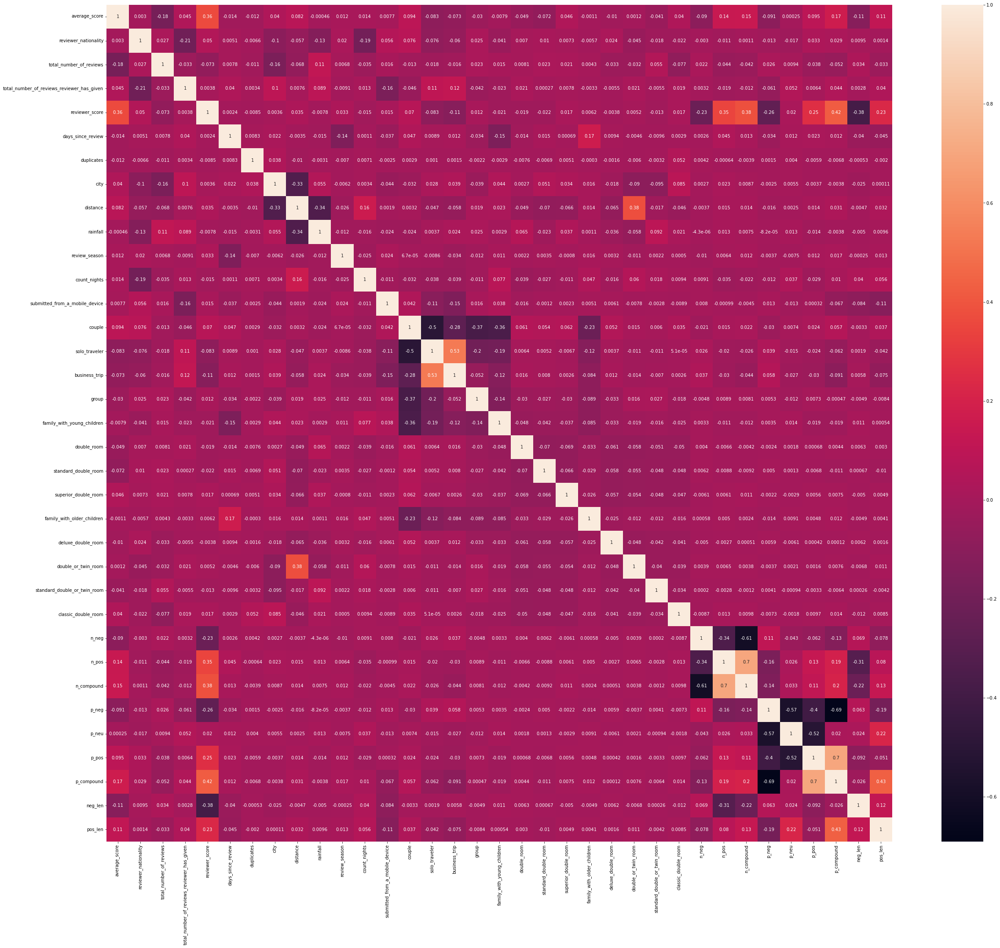

In [68]:
# Оценим корреляцию по методу Пирсона
plt.rcParams['figure.figsize'] = (35,40)
sns.heatmap(data.corr(), annot=True)

In [58]:
object_columns = [s for s in data.columns if data[s].dtypes == 'object']
data.drop(object_columns, axis = 1, inplace=True)

In [61]:
import plotly.express as px
# чтобы исключить мультиколлениарность удалим признаки, сильно коррелирующие с другими признаками
pivot = data.corr()
# pivot = pivot.drop('sample', axis=0)
# pivot = pivot.drop('sample', axis=1)
for col in pivot:
    pivot[col] = pivot[col].apply(lambda x: np.nan if (abs(x) < 0.72 or x == 1) else x)
for col in pivot:
    pivot = pivot.dropna(how='all')
    pivot = pivot.dropna(how='all', axis='columns')
fig = px.imshow(pivot)
fig.show()

In [62]:
# постараемся удалить минимальное количество признаков - удаляем признаки с максимальной корреляцией
counter = 0
for lower_bound in np.linspace(0.98, 0.72, num=14):
    for col in pivot:
        if pivot[col].max() > lower_bound or pivot[col].min() < -lower_bound:
            print('Удаляем колонку', col)
            pivot = pivot.drop(col, axis=0)
            pivot = pivot.drop(col, axis=1)
            data = data.drop(col, axis=1)
            counter += 1
print('Удалено колонок: ', counter)

Удаляем колонку review_total_negative_word_counts
Удаляем колонку review_total_positive_word_counts
Удаляем колонку n_neu
Удаляем колонку leisure_trip
Удаляем колонку additional_number_of_scoring
Удалено колонок:  5


In [63]:
# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели  
# Х - данные с информацией об отелях, у - целевая переменная (рейтинги отелей)  
X = data.drop(['reviewer_score'], axis = 1)  
y = data['reviewer_score'] 

In [64]:
# Загружаем специальный инструмент для разбивки:  
from sklearn.model_selection import train_test_split  

In [65]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.  
# Для тестирования мы будем использовать 25% от исходного датасета.  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [66]:
# Импортируем необходимые библиотеки:  
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели  
from sklearn import metrics # инструменты для оценки точности модели  
  
# Создаём модель  
regr = RandomForestRegressor(n_estimators=100)  
      
# Обучаем модель на тестовом наборе данных  
regr.fit(X_train, y_train)  
      
# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_pred  
y_pred = regr.predict(X_test)  


In [67]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAPE: 0.12251627073957075
MAE: 0.8602781667200956
